# ALS BL5.3.1 Commissioning using bluesky

awojdyla@lbl.gov francisho@lbl.gov - June 2025

We are commissionning the beamlines using EPICS/bluesky after prolonged dark time.

We want to:
+ perform bluesky scan for simple diode
+ Perform energy scan to evaluate the effects of the cryo cooler on the mono. 
+ Evaluate the photon energy resolution of the BL. 
+ perform scanning imaging

## Set Up

### Import libraries

In [21]:
import numpy as np
import matplotlib.pyplot as plt

import h5py
import hdf5plugin   # For compression support

import time 
import os
from datetime import datetime

In [5]:
import epics
import bluesky

from bluesky import RunEngine
RE = RunEngine({})


In [6]:
from databroker import Broker
db = Broker.named('temp')

# Insert all metadata/data captured into db.
RE.subscribe(db.insert)

0

### Connecting to EPICS motors

In [12]:
from ophyd import EpicsMotor
import ophyd
ophyd.set_cl('caproto')

mono_angle_deg = ophyd.EpicsMotor('bl531_xps1:mono_angle_deg', name='mono angle [deg]')
beamstop_diode = ophyd.EpicsSignal('bl201-beamstop:current', name='beamstop diode')
sample_x_mm = ophyd.EpicsMotor('bl531_xps2:sample_x_mm', name='sample stage horizontal')
sample_y_mm = ophyd.EpicsMotor('bl531_xps2:sample_y_mm', name='sample stage vertical')

#this works
mono_angle_deg.wait_for_connection(timeout=2.0)
mono_angle_deg.read()
beamstop_diode.wait_for_connection(timeout=2.0)
beamstop_diode.read()

{'beamstop diode': {'value': -184.61, 'timestamp': 1750985081.695446}}

## Sample scan

In [ ]:
mono_angle_deg.move(25)

In [ ]:
from bluesky.plans import grid_scan
from matplotlib import pyplot as plt
RE(grid_scan([beamstop_diode], sample_x_mm, 0, 20, 5, sample_y_mm, 0,20,5,snake_axes=True))

In [ ]:
%matplotlib inline

header = db[-1]
a = header.table()

# horizontal axis is reverted somehow (14,6 is optimal) 

h = a['sample stage horizontal'].to_numpy()
v = a['sample stage vertical'].to_numpy()
b = a['beamstop diode'].to_numpy()
b = b.reshape(5, 5)

plt.imshow(b.T, extent=(h.min(), h.max(), v.max(), v.min()), aspect='equal')     # transpose to get the right orientation
plt.xlabel('beamstop horizontal (mm)')
plt.ylabel('beamstop vertical (mm)')
plt.title('beamstop diode current (A)')
plt.colorbar()
plt.show()

In [ ]:
from bluesky.plans import grid_scan

RE(grid_scan([beamstop_diode], sample_x_mm, 0, 20, 21, sample_y_mm, 0,20,21,snake_axes=True))

In [ ]:
header = db[-1]
a = header.table()

# horizontal axis is reverted somehow (14,6 is optimal) 

h = a['sample stage horizontal'].to_numpy()
v = a['sample stage vertical'].to_numpy()
b = a['beamstop diode'].to_numpy()
b = b.reshape(21, 21)

plt.imshow(b.T, extent=(h.min(), h.max(), v.max(), v.min()), aspect='auto')
plt.xlabel('beamstop horizontal (mm)')
plt.ylabel('beamstop vertical (mm)')
plt.title('beamstop diode current on lego')
plt.colorbar()
plt.show()

In [ ]:
sample_y_mm.settle_time = 0.5
sample_x_mm.settle_time = 0.5

In [ ]:
RE.stop()

In [ ]:
RE(grid_scan([beamstop_diode], sample_x_mm, 0, 20, 21, sample_y_mm, 0,20,21,snake_axes=False))

In [ ]:
header = db[-1]
a = header.table()

# horizontal axis is reverted somehow (14,6 is optimal) 

h = a['sample stage horizontal'].to_numpy()
v = a['sample stage vertical'].to_numpy()
b = a['beamstop diode'].to_numpy()
b = b.reshape(21, 21)
b[b<-1500] = -1500

plt.imshow(b.T, extent=(h.min(), h.max(), v.max(), v.min()), aspect='auto')
plt.xlabel('beamstop horizontal (mm)')
plt.ylabel('beamstop vertical (mm)')
plt.title('beamstop diode current on lego')
plt.colorbar()
plt.show()

In [ ]:
RE(grid_scan([beamstop_diode], sample_x_mm, 0, 1, 2, sample_y_mm, 0,1,2,snake_axes=False))

In [ ]:
header = db[-1]
a = header.table()

# horizontal axis is reverted somehow (14,6 is optimal) 

h = a['sample stage horizontal'].to_numpy()
v = a['sample stage vertical'].to_numpy()
b = a['beamstop diode'].to_numpy()
b = b.reshape(21, 21)
b[b<-1500] = -1500

plt.imshow(b.T, extent=(h.min(), h.max(), v.max(), v.min()), aspect='auto')
plt.xlabel('beamstop horizontal (mm)')
plt.ylabel('beamstop vertical (mm)')
plt.title('beamstop diode current on lego')
plt.colorbar()
plt.show()

## Sample scan with Pilatus

### Connecting Pilatus (trying)

In [10]:
from bluesky.plans import grid_scan

In [55]:
from ophyd import ADComponent
from ophyd import ImagePlugin
from ophyd import PilatusDetector
from ophyd import SingleTrigger
from ophyd.areadetector.filestore_mixins import FileStoreHDF5IterativeWrite
from ophyd.areadetector.plugins import HDF5Plugin_V34
import os


PILATUS_FILES_ROOT = "/mnt/data531"
BLUESKY_FILES_ROOT = "/mnt/data531"
TEST_IMAGE_DIR = "test/pilatus/%Y/%m/%d/"


class MyHDF5Plugin(FileStoreHDF5IterativeWrite, HDF5Plugin_V34): ...


class MyPilatusDetector(SingleTrigger, PilatusDetector):
    """Pilatus detector"""
    image = ADComponent(ImagePlugin, "image1:")
    hdf1 = ADComponent(
        MyHDF5Plugin,
        "HDF1:",
        write_path_template=os.path.join(PILATUS_FILES_ROOT, TEST_IMAGE_DIR),
        read_path_template=os.path.join(BLUESKY_FILES_ROOT, TEST_IMAGE_DIR),
    )


det = MyPilatusDetector("13PIL1:", name="det")

det.hdf1.create_directory.put(-5)
det.cam.stage_sigs["image_mode"] = "Single"
det.cam.stage_sigs["num_images"] = 1
det.cam.stage_sigs["acquire_time"] = 0.1
det.cam.stage_sigs["acquire_period"] = 0.105
det.hdf1.stage_sigs["lazy_open"] = 1
det.hdf1.stage_sigs["compression"] = "LZ4"
det.hdf1.stage_sigs["file_template"] = "%s%s_%3.3d.h5"
del det.hdf1.stage_sigs["capture"]
det.hdf1.stage_sigs["capture"] = 1

In [56]:
RE.stop()

Stopping: running cleanup and marking exit_status as 'success'...


('d0f41822-cc1d-4942-9dd8-8f2e4b45ac50',)

In [53]:
# running a scan with the pilatus detector
RE(grid_scan([det], sample_x_mm, 0, 2, 2, sample_y_mm, 0, 2, 2,snake_axes=False))

A 'deferred pause' has been requested. The RunEngine will pause at the next checkpoint. To pause immediately, hit Ctrl+C again in the next 10 seconds.
Deferred pause acknowledged. Continuing to checkpoint.
Pausing...


RunEngineInterrupted: 
Your RunEngine is entering a paused state. These are your options for changing
the state of the RunEngine:

RE.resume()    Resume the plan.
RE.abort()     Perform cleanup, then kill plan. Mark exit_stats='aborted'.
RE.stop()      Perform cleanup, then kill plan. Mark exit_status='success'.
RE.halt()      Emergency Stop: Do not perform cleanup --- just stop.


In [ ]:
from bluesky.callbacks import CallbackBase
import glob
import os
from datetime import datetime

class TiffFileCollector(CallbackBase):
    def __init__(self, base_path="/mnt/data531"):
        self.file_paths = []
        self.base_path = base_path
        self.scan_start_time = None
    
    def start(self, doc):
        self.scan_start_time = datetime.now()
        print(f"Scan started at {self.scan_start_time}")
    
    def event(self, doc):
        # Check for new TIFF files created since scan start
        if self.scan_start_time:
            pattern = os.path.join(self.base_path, "*alien*.tif")
            all_files = glob.glob(pattern)
            
            for file_path in all_files:
                file_time = datetime.fromtimestamp(os.path.getmtime(file_path))
                if file_time >= self.scan_start_time and file_path not in self.file_paths:
                    self.file_paths.append(file_path)
                    print(f"New file detected: {file_path}")
    
    def stop(self, doc):
        # Final check for any remaining files
        if self.scan_start_time:
            pattern = os.path.join(self.base_path, "*alien*.tif")
            all_files = glob.glob(pattern)
            
            for file_path in all_files:
                file_time = datetime.fromtimestamp(os.path.getmtime(file_path))
                if file_time >= self.scan_start_time and file_path not in self.file_paths:
                    self.file_paths.append(file_path)
        
        print(f"\nScan completed. Total files created: {len(self.file_paths)}")
        for i, path in enumerate(sorted(self.file_paths), 1):
            print(f"  {i}: {path}")

# Use it in your scan
file_collector = TiffFileCollector()
RE(grid_scan([det], sample_x_mm, 0, 2, 2, sample_y_mm, 0, 2, 2, snake_axes=False), 
   file_collector)

# Access the collected file paths
print("All TIFF file paths:", sorted(file_collector.file_paths))

In [ ]:
from bluesky.callbacks import CallbackBase
import glob
import os
from datetime import datetime
import threading
import time

class LiveFileTable(CallbackBase):
    def __init__(self, base_path="/mnt/data531", pattern="*alien*.tif", update_interval=0.5):
        self.base_path = base_path
        self.pattern = os.path.join(base_path, pattern)
        self.update_interval = update_interval
        self.monitoring = False
        self.new_files = []
        self.start_time = None
        self.scan_counter = 0
        
        # Print table header
        self.print_header()
    
    def print_header(self):
        """Print the table header"""
        print("\n" + "="*80)
        print(f"{'Point':<6} {'Time':<12} {'File Name':<40} {'Full Path':<20}")
        print("="*80)
    
    def print_file_row(self, point_num, file_path):
        """Print a row for a new file"""
        file_name = os.path.basename(file_path)
        current_time = datetime.now().strftime("%H:%M:%S")
        
        # Truncate long paths for display
        display_path = file_path if len(file_path) <= 20 else "..." + file_path[-17:]
        
        print(f"{point_num:<6} {current_time:<12} {file_name:<40} {display_path:<20}")
    
    def start(self, doc):
        """Called when scan starts"""
        self.start_time = datetime.now()
        self.scan_counter = 0
        self.new_files = []
        self.monitoring = True
        
        print(f"\nScan started at {self.start_time.strftime('%H:%M:%S')}")
        print("Monitoring for new files...")
        
        # Start file monitoring thread
        self.monitor_thread = threading.Thread(target=self._monitor_files)
        self.monitor_thread.daemon = True
        self.monitor_thread.start()
    
    def event(self, doc):
        """Called for each scan point - we'll use this to track scan progress"""
        self.scan_counter += 1
    
    def _monitor_files(self):
        """Monitor filesystem for new files"""
        known_files = set(glob.glob(self.pattern))
        
        while self.monitoring:
            try:
                current_files = set(glob.glob(self.pattern))
                new = current_files - known_files
                
                for file_path in sorted(new):  # Sort to ensure consistent order
                    if self.start_time:
                        try:
                            file_time = datetime.fromtimestamp(os.path.getmtime(file_path))
                            if file_time >= self.start_time:
                                self.new_files.append(file_path)
                                # Print immediately when file is detected
                                self.print_file_row(len(self.new_files), file_path)
                        except OSError:
                            # File might be in process of being written
                            continue
                
                known_files = current_files
                time.sleep(self.update_interval)
                
            except Exception as e:
                print(f"Error monitoring files: {e}")
                break
    
    def stop(self, doc):
        """Called when scan stops"""
        self.monitoring = False
        
        # Wait a bit for any final files
        time.sleep(1)
        
        # Final check for any missed files
        final_files = set(glob.glob(self.pattern))
        for file_path in sorted(final_files):
            if self.start_time:
                try:
                    file_time = datetime.fromtimestamp(os.path.getmtime(file_path))
                    if file_time >= self.start_time and file_path not in self.new_files:
                        self.new_files.append(file_path)
                        self.print_file_row(len(self.new_files), file_path)
                except OSError:
                    continue
        
        print("="*80)
        print(f"Scan completed. Total files created: {len(self.new_files)}")
        print("="*80)
        
        if hasattr(self, 'monitor_thread'):
            self.monitor_thread.join(timeout=2)

# Usage - replace your scan with this:
live_file_table = LiveFileTable()

RE(grid_scan([det], sample_x_mm, 0, 2, 2, sample_y_mm, 0, 2, 2, snake_axes=False), 
   live_file_table)

In [ ]:
import ophyd
from bluesky.callbacks import CallbackBase
import glob
import os
from datetime import datetime
import threading
import time

# Your motor definitions
sample_x_mm = ophyd.EpicsMotor('bl531_xps2:sample_x_mm', name='sample stage horizontal')
sample_y_mm = ophyd.EpicsMotor('bl531_xps2:sample_y_mm', name='sample stage vertical')

class FixedLiveTable(CallbackBase):
    def __init__(self):
        self.monitoring = False
        self.start_time = None
        self.scan_points = []
        self.files_found = []
        
    def start(self, doc):
        self.start_time = datetime.now()
        self.monitoring = True
        self.scan_points = []
        self.files_found = []
        
        print(f"\n{'Point':<6} {'X_mm':<8} {'Y_mm':<8} {'Time':<10} {'Full Path':<50}")
        print("-" * 90)
        threading.Thread(target=self._watch, daemon=True).start()
    
    def event(self, doc):
        """Store each scan point as it happens"""
        point_info = {
            'point_num': doc['seq_num'],
            'x_pos': doc['data'].get('sample stage horizontal', 0),
            'y_pos': doc['data'].get('sample stage vertical', 0),
            'event_time': time.time(),
            'file_matched': False
        }
        self.scan_points.append(point_info)
    
    def _watch(self):
        """Monitor for new files and match them to scan points in order"""
        known_files = set(glob.glob("/mnt/data531/*alien*.tif"))
        
        while self.monitoring:
            try:
                current_files = set(glob.glob("/mnt/data531/*alien*.tif"))
                new_files = current_files - known_files
                
                for file_path in sorted(new_files):
                    try:
                        file_time = datetime.fromtimestamp(os.path.getmtime(file_path))
                        if file_time >= self.start_time and file_path not in self.files_found:
                            self.files_found.append(file_path)
                            
                            # Match file to the next unmatched scan point
                            unmatched_point = self._get_next_unmatched_point()
                            if unmatched_point:
                                unmatched_point['file_matched'] = True
                                unmatched_point['file_path'] = file_path
                                
                                # Display the matched point and file
                                current_time = datetime.now().strftime('%H:%M:%S')
                                print(f"{unmatched_point['point_num']:<6} "
                                      f"{unmatched_point['x_pos']:<8.3f} "
                                      f"{unmatched_point['y_pos']:<8.3f} "
                                      f"{current_time:<10} "
                                      f"{file_path:<50}")
                                
                    except OSError:
                        continue
                        
                known_files = current_files
                time.sleep(0.1)  # Check more frequently
            except Exception as e:
                continue
    
    def _get_next_unmatched_point(self):
        """Get the next scan point that hasn't been matched to a file"""
        for point in self.scan_points:
            if not point['file_matched']:
                return point
        return None
    
    def stop(self, doc):
        """Final cleanup and summary"""
        self.monitoring = False
        
        # Wait longer for any final files and check multiple times
        for i in range(10):  # Check 10 times over 5 seconds
            time.sleep(0.5)
            
            final_files = sorted(glob.glob("/mnt/data531/*alien*.tif"))
            for file_path in final_files:
                try:
                    file_time = datetime.fromtimestamp(os.path.getmtime(file_path))
                    if (file_time >= self.start_time and 
                        file_path not in self.files_found):
                        
                        self.files_found.append(file_path)
                        unmatched_point = self._get_next_unmatched_point()
                        
                        if unmatched_point:
                            unmatched_point['file_matched'] = True
                            unmatched_point['file_path'] = file_path
                            
                            current_time = datetime.now().strftime('%H:%M:%S')
                            print(f"{unmatched_point['point_num']:<6} "
                                  f"{unmatched_point['x_pos']:<8.3f} "
                                  f"{unmatched_point['y_pos']:<8.3f} "
                                  f"{current_time:<10} "
                                  f"{file_path:<50}")
                            
                except OSError:
                    continue
        
        print("-" * 90)
        print(f"Scan completed: {len(self.scan_points)} points, {len(self.files_found)} files")
        
        # Show final summary
        print(f"\nFinal Summary:")
        for point in self.scan_points:
            if point['file_matched']:
                file_name = os.path.basename(point['file_path'])
                print(f"  Point {point['point_num']}: X={point['x_pos']:.3f}mm, Y={point['y_pos']:.3f}mm -> {file_name}")
            else:
                print(f"  Point {point['point_num']}: X={point['x_pos']:.3f}mm, Y={point['y_pos']:.3f}mm -> NO FILE FOUND")
        
        # Show all files found during scan (for verification)
        print(f"\nAll files detected during scan:")
        for i, file_path in enumerate(self.files_found, 1):
            print(f"  {i}: {os.path.basename(file_path)}")
        
        print("-" * 90)

# Create the live table and run the scan
fixed_table = FixedLiveTable()

# Running a scan with the pilatus detector using your defined motors
RE(grid_scan([det], sample_x_mm, 0, 2, 2, sample_y_mm, 0, 2, 2, snake_axes=False), fixed_table)

In [ ]:
import ophyd
from bluesky.callbacks import CallbackBase
import glob
import os
from datetime import datetime
import threading
import time

# Your motor definitions
sample_x_mm = ophyd.EpicsMotor('bl531_xps2:sample_x_mm', name='sample stage horizontal')
sample_y_mm = ophyd.EpicsMotor('bl531_xps2:sample_y_mm', name='sample stage vertical')

class AggressiveLiveTable(CallbackBase):
    def __init__(self):
        self.monitoring = False
        self.start_time = None
        self.scan_points = []
        self.files_found = []
        self.expected_points = 0
        
    def start(self, doc):
        self.start_time = datetime.now()
        self.monitoring = True
        self.scan_points = []
        self.files_found = []
        self.expected_points = 0
        
        print(f"\n{'Point':<6} {'X_mm':<8} {'Y_mm':<8} {'Time':<10} {'Full Path':<50}")
        print("-" * 90)
        threading.Thread(target=self._watch, daemon=True).start()
    
    def event(self, doc):
        """Store each scan point as it happens"""
        point_info = {
            'point_num': doc['seq_num'],
            'x_pos': doc['data'].get('sample stage horizontal', 0),
            'y_pos': doc['data'].get('sample stage vertical', 0),
            'event_time': time.time(),
            'file_matched': False
        }
        self.scan_points.append(point_info)
        self.expected_points = len(self.scan_points)
    
    def _watch(self):
        """Monitor for new files continuously"""
        known_files = set(glob.glob("/mnt/data531/*alien*.tif"))
        
        while self.monitoring or len(self.files_found) < self.expected_points:
            try:
                current_files = set(glob.glob("/mnt/data531/*alien*.tif"))
                new_files = current_files - known_files
                
                for file_path in sorted(new_files):
                    try:
                        file_time = datetime.fromtimestamp(os.path.getmtime(file_path))
                        if file_time >= self.start_time and file_path not in self.files_found:
                            self.files_found.append(file_path)
                            
                            # Match file to the next unmatched scan point
                            unmatched_point = self._get_next_unmatched_point()
                            if unmatched_point:
                                unmatched_point['file_matched'] = True
                                unmatched_point['file_path'] = file_path
                                
                                # Display the matched point and file
                                current_time = datetime.now().strftime('%H:%M:%S')
                                print(f"{unmatched_point['point_num']:<6} "
                                      f"{unmatched_point['x_pos']:<8.3f} "
                                      f"{unmatched_point['y_pos']:<8.3f} "
                                      f"{current_time:<10} "
                                      f"{file_path:<50}")
                                
                    except OSError:
                        continue
                        
                known_files = current_files
                time.sleep(0.1)
                
                # If scan is done but we're still missing files, keep checking
                if not self.monitoring and len(self.files_found) < self.expected_points:
                    continue
                elif not self.monitoring and len(self.files_found) >= self.expected_points:
                    break
                    
            except Exception as e:
                continue
    
    def _get_next_unmatched_point(self):
        """Get the next scan point that hasn't been matched to a file"""
        for point in self.scan_points:
            if not point['file_matched']:
                return point
        return None
    
    def stop(self, doc):
        """Final cleanup and summary"""
        print(f"\nScan finished, waiting for final files...")
        
        # Give the monitoring thread time to catch final files
        time.sleep(3)
        self.monitoring = False
        
        # Wait for monitoring thread to finish
        time.sleep(2)
        
        print("-" * 90)
        print(f"Scan completed: {len(self.scan_points)} points, {len(self.files_found)} files")
        
        # Show final summary
        print(f"\nFinal Summary:")
        for point in self.scan_points:
            if point['file_matched']:
                file_name = os.path.basename(point['file_path'])
                print(f"  Point {point['point_num']}: X={point['x_pos']:.3f}mm, Y={point['y_pos']:.3f}mm -> {file_name}")
            else:
                print(f"  Point {point['point_num']}: X={point['x_pos']:.3f}mm, Y={point['y_pos']:.3f}mm -> NO FILE FOUND")
        
        print("-" * 90)

# Create the live table and run the scan
aggressive_table = AggressiveLiveTable()

# Running a scan with the pilatus detector using your defined motors
RE(grid_scan([det], sample_x_mm, 0, 2, 2, sample_y_mm, 0, 2, 2, snake_axes=False), aggressive_table)

In [ ]:
## THE BEST OF THE BEST (FOR NOW!)

import ophyd
from bluesky.callbacks import CallbackBase
import glob
import os
from datetime import datetime
import threading
import time

# Your motor definitions
sample_x_mm = ophyd.EpicsMotor('bl531_xps2:sample_x_mm', name='sample stage horizontal')
sample_y_mm = ophyd.EpicsMotor('bl531_xps2:sample_y_mm', name='sample stage vertical')

class OrderedLiveTable(CallbackBase):
    def __init__(self):
        self.monitoring = False
        self.start_time = None
        self.scan_points = []
        self.files_before_scan = set()
        self.displayed_points = set()  # Track which points we've already displayed
        
    def start(self, doc):
        # Capture files that exist BEFORE scan starts
        self.files_before_scan = set(glob.glob("/mnt/data531/*alien*.tif"))
        
        self.start_time = datetime.now()
        self.monitoring = True
        self.scan_points = []
        self.displayed_points = set()
        
        print(f"\n{'Point':<6} {'X_mm':<8} {'Y_mm':<8} {'Time':<10} {'Full Path':<50}")
        print("-" * 90)
        threading.Thread(target=self._watch, daemon=True).start()
    
    def event(self, doc):
        """Store each scan point as it happens"""
        point_info = {
            'point_num': doc['seq_num'],
            'x_pos': doc['data'].get('sample stage horizontal', 0),
            'y_pos': doc['data'].get('sample stage vertical', 0),
            'event_time': time.time(),
            'file_matched': False,
            'file_path': None
        }
        self.scan_points.append(point_info)
    
    def _watch(self):
        """Monitor and display files as they're detected"""
        while self.monitoring:
            try:
                # Get all current scan files
                current_files = set(glob.glob("/mnt/data531/*alien*.tif"))
                scan_files = sorted(current_files - self.files_before_scan)
                
                # Check if we have new files to display
                for i, file_path in enumerate(scan_files):
                    point_index = i  # File index matches point index
                    
                    if (point_index < len(self.scan_points) and 
                        point_index not in self.displayed_points):
                        
                        # Match file to corresponding scan point
                        point = self.scan_points[point_index]
                        point['file_matched'] = True
                        point['file_path'] = file_path
                        
                        # Display immediately
                        current_time = datetime.now().strftime('%H:%M:%S')
                        print(f"{point['point_num']:<6} "
                              f"{point['x_pos']:<8.3f} "
                              f"{point['y_pos']:<8.3f} "
                              f"{current_time:<10} "
                              f"{file_path:<50}")
                        
                        self.displayed_points.add(point_index)
                        
                time.sleep(0.1)
                
            except Exception as e:
                continue
    
    def stop(self, doc):
        """Final cleanup and ensure all files are matched"""
        print(f"\nScan finished, doing final file matching...")
        
        time.sleep(2)  # Wait for any final files
        
        # Get final list of all scan files
        final_files = set(glob.glob("/mnt/data531/*alien*.tif"))
        scan_files = sorted(final_files - self.files_before_scan)
        
        print(f"DEBUG: Files before scan: {len(self.files_before_scan)}")
        print(f"DEBUG: Files after scan: {len(final_files)}")
        print(f"DEBUG: New files during scan: {len(scan_files)}")
        
        # Match remaining files to points that weren't displayed live
        for i, file_path in enumerate(scan_files):
            if i < len(self.scan_points):
                point = self.scan_points[i]
                point['file_matched'] = True
                point['file_path'] = file_path
                
                # Display any points that weren't shown live
                if i not in self.displayed_points:
                    current_time = datetime.now().strftime('%H:%M:%S')
                    print(f"{point['point_num']:<6} "
                          f"{point['x_pos']:<8.3f} "
                          f"{point['y_pos']:<8.3f} "
                          f"{current_time:<10} "
                          f"{file_path:<50}")
        
        self.monitoring = False
        
        print("-" * 90)
        print(f"Scan completed: {len(self.scan_points)} points, {len(scan_files)} files")
        
        # Show final summary with correct file-to-point mapping
        print(f"\nFinal Summary (Correct File-to-Point Mapping):")
        for i, point in enumerate(self.scan_points):
            if i < len(scan_files):
                file_name = os.path.basename(scan_files[i])
                print(f"  Point {point['point_num']}: X={point['x_pos']:.3f}mm, Y={point['y_pos']:.3f}mm -> {file_name}")
            else:
                print(f"  Point {point['point_num']}: X={point['x_pos']:.3f}mm, Y={point['y_pos']:.3f}mm -> NO FILE FOUND")
        
        # Show chronological file list
        print(f"\nFiles created during scan (chronological order):")
        for i, file_path in enumerate(scan_files, 1):
            print(f"  {i}: {os.path.basename(file_path)}")
        
        print("-" * 90)

# Create the live table and run the scan
ordered_table = OrderedLiveTable()

# Running a scan with the pilatus detector using your defined motors
RE(grid_scan([det], sample_x_mm, 0, 2, 2, sample_y_mm, 0, 2, 2, snake_axes=False), ordered_table)

In [ ]:
import ophyd
from bluesky.callbacks import CallbackBase
from datetime import datetime

# Motor definitions for sample positioning
sample_x_mm = ophyd.EpicsMotor('bl531_xps2:sample_x_mm', name='sample stage horizontal')
sample_y_mm = ophyd.EpicsMotor('bl531_xps2:sample_y_mm', name='sample stage vertical')

class DetectorLiveTable(CallbackBase):
    """Live table showing scan progress with motor positions and detector filenames"""
    
    def __init__(self, detector):
        self.detector = detector
        self.scan_points = []
        
    def start(self, doc):
        """Initialize scan and print table header"""
        self.scan_points = []
        print(f"\n{'Point':<6} {'X_mm':<8} {'Y_mm':<8} {'Time':<10} {'Filename':<40}")
        print("-" * 80)
    
    def event(self, doc):
        """Process each scan point and display live results"""
        point_num = doc['seq_num']
        x_pos = doc['data'].get('sample stage horizontal', 0)
        y_pos = doc['data'].get('sample stage vertical', 0)
        
        # Get filename directly from detector IOC
        try:
            filename = None
            
            # Method 1: Get full filename from HDF5 plugin
            if hasattr(self.detector, 'hdf1') and hasattr(self.detector.hdf1, 'full_file_name'):
                filename = self.detector.hdf1.full_file_name.get()
            
            # Method 2: Construct filename from HDF5 components
            elif hasattr(self.detector, 'hdf1'):
                try:
                    file_path = self.detector.hdf1.file_path.get()
                    file_name = self.detector.hdf1.file_name.get()
                    file_number = self.detector.hdf1.file_number.get()
                    template = self.detector.hdf1.file_template.get()
                    
                    if template and file_name:
                        filename = template % (file_path, file_name, file_number)
                    else:
                        filename = f"{file_path}/{file_name}_{file_number:03d}.h5"
                except:
                    pass
            
            # Method 3: Search event data for filename fields
            if not filename:
                for key in doc['data'].keys():
                    if 'file' in key.lower() and 'name' in key.lower():
                        filename = doc['data'][key]
                        break
            
            # Fallback: Generate generic filename
            if not filename:
                filename = f"Image_{point_num:03d}"
            
            # Store scan point data
            point_info = {
                'point_num': point_num,
                'x_pos': x_pos,
                'y_pos': y_pos,
                'filename': filename
            }
            self.scan_points.append(point_info)
            
            # Display live results
            current_time = datetime.now().strftime('%H:%M:%S')
            display_filename = filename.split('/')[-1] if '/' in str(filename) else str(filename)
            
            print(f"{point_num:<6} {x_pos:<8.3f} {y_pos:<8.3f} {current_time:<10} {display_filename:<40}")
            
        except Exception as e:
            print(f"Error getting filename for point {point_num}: {e}")
    
    def stop(self, doc):
        """Display scan completion summary"""
        print("-" * 80)
        print(f"Scan completed: {len(self.scan_points)} points")
        
        print(f"\nComplete file list:")
        for point in self.scan_points:
            print(f"  Point {point['point_num']}: X={point['x_pos']:.3f}mm, Y={point['y_pos']:.3f}mm")
            print(f"    -> {point['filename']}")
        print("-" * 80)

# Create live table instance
detector_table = DetectorLiveTable(det)

# Run grid scan with live monitoring
RE(grid_scan([det], sample_x_mm, 0, 2, 2, sample_y_mm, 0, 2, 2, snake_axes=False), detector_table)

#### Comments

__Above Gabriel resolved the problem for us!__ 

Some further editing below.

In [ ]:
import ophyd
from bluesky.callbacks import CallbackBase
from datetime import datetime

# Motor definitions for sample positioning
sample_x_mm = ophyd.EpicsMotor('bl531_xps2:sample_x_mm', name='sample stage horizontal')
sample_y_mm = ophyd.EpicsMotor('bl531_xps2:sample_y_mm', name='sample stage vertical')

class DetectorLiveTable(CallbackBase):
    """Live table showing scan progress with motor positions, filename displayed at end"""
    
    def __init__(self, detector):
        self.detector = detector
        self.scan_points = []
        self.filename = None
        
    def start(self, doc):
        """Initialize scan and print table header"""
        self.scan_points = []
        self.filename = None
        print(f"\n{'Point':<6} {'X_mm':<8} {'Y_mm':<8} {'Time':<10}")
        print("-" * 40)
    
    def event(self, doc):
        """Process each scan point and display live results"""
        point_num = doc['seq_num']
        x_pos = doc['data'].get('sample stage horizontal', 0)
        y_pos = doc['data'].get('sample stage vertical', 0)
        
        # Get filename from detector IOC (only once since it's the same file)
        if not self.filename:
            try:
                # Method 1: Get full filename from HDF5 plugin
                if hasattr(self.detector, 'hdf1') and hasattr(self.detector.hdf1, 'full_file_name'):
                    self.filename = self.detector.hdf1.full_file_name.get()
                
                # Method 2: Construct filename from HDF5 components
                elif hasattr(self.detector, 'hdf1'):
                    try:
                        file_path = self.detector.hdf1.file_path.get()
                        file_name = self.detector.hdf1.file_name.get()
                        file_number = self.detector.hdf1.file_number.get()
                        template = self.detector.hdf1.file_template.get()
                        
                        if template and file_name:
                            self.filename = template % (file_path, file_name, file_number)
                        else:
                            self.filename = f"{file_path}/{file_name}_{file_number:03d}.h5"
                    except:
                        pass
                
                # Fallback: Generate generic filename
                if not self.filename:
                    self.filename = f"scan_data.h5"
                    
            except Exception as e:
                print(f"Error getting filename: {e}")
                self.filename = "unknown_file.h5"
        
        # Store scan point data
        point_info = {
            'point_num': point_num,
            'x_pos': x_pos,
            'y_pos': y_pos,
            'frame_num': point_num - 1  # HDF5 frames are 0-indexed
        }
        self.scan_points.append(point_info)
        
        # Display live motor positions only
        current_time = datetime.now().strftime('%H:%M:%S')
        print(f"{point_num:<6} {x_pos:<8.3f} {y_pos:<8.3f} {current_time:<10}")
    
    def stop(self, doc):
        """Display scan completion summary with scan description"""
        print("-" * 40)
        print(f"Scan completed: {len(self.scan_points)} points")
        
        # Display scan description and file info
        if self.filename and self.scan_points:
            print(f"\nHDF5 File: {self.filename}")
            
            # Calculate scan parameters
            x_positions = [p['x_pos'] for p in self.scan_points]
            y_positions = [p['y_pos'] for p in self.scan_points]
            x_range = f"{min(x_positions):.1f} to {max(x_positions):.1f} mm"
            y_range = f"{min(y_positions):.1f} to {max(y_positions):.1f} mm"
            
            print(f"Scan type: {len(self.scan_points)}-point grid scan")
            print(f"X range: {x_range}")
            print(f"Y range: {y_range}")
            print(f"Contains {len(self.scan_points)} detector frames (one per scan point)")
            
            # Save file path as global variable for data analysis
            global last_scan_file, last_scan_data
            last_scan_file = self.filename
            last_scan_data = self.scan_points.copy()
            
            print(f"\n📁 File path saved as: 'last_scan_file'")
            print(f"📊 Scan data saved as: 'last_scan_data'")
        
        print("-" * 40)

# Create live table instance
detector_table = DetectorLiveTable(det)

# Run grid scan with live monitoring
RE(grid_scan([det], sample_x_mm, 0, 2, 2, sample_y_mm, 0, 2, 2, snake_axes=False), detector_table)

In [ ]:
import h5py
import hdf5plugin  # This loads the compression plugins
import numpy as np
import matplotlib.pyplot as plt

# Load and display all 4 images in a compact grid
with h5py.File(last_scan_file, 'r') as f:
    data = f['entry/data/data']
    print(f"Data shape: {data.shape}")
    
    # Create a 2x2 subplot for all 4 images
    fig, axes = plt.subplots(2, 2, figsize=(10, 8))
    axes = axes.flatten()  # Make it easier to iterate
    
    # Load and display each frame
    for i in range(min(4, data.shape[0])):
        frame = data[i]
        scan_point = last_scan_data[i]
        
        # Display image with better contrast
        im = axes[i].imshow(frame, cmap='viridis', 
                           vmin=np.percentile(frame, 1), 
                           vmax=np.percentile(frame, 99))
        
        axes[i].set_title(f'Frame {i}\nX={scan_point["x_pos"]:.1f}mm, Y={scan_point["y_pos"]:.1f}mm', 
                         fontsize=10)
        axes[i].axis('off')  # Remove axes for cleaner look
        
        # Add colorbar to each subplot
        plt.colorbar(im, ax=axes[i], shrink=0.8)
        
        print(f"Frame {i}: shape={frame.shape}, min={frame.min()}, max={frame.max()}, mean={frame.mean():.1f}")
    
    plt.tight_layout()
    plt.suptitle(f'All Frames from Scan\nFile: {last_scan_file.split("/")[-1]}', 
                 fontsize=12, y=1.02)
    plt.show()

# Quick summary
print(f"\nScan Summary:")
print(f"Total frames: {data.shape[0]}")
print(f"Image size: {data.shape[1]} x {data.shape[2]} pixels")


### Summary (by Francis, June 26 5 pm)

With Gabriel's kind help, so far we have two main solutions:
1. Find the .tif files, which are generated by the adl, under a customized folder with a customized name. 
2. Without knowing any customized filename or pathname, locate the raw .h5 file. 

#### Solution 1: .TIF

In [ ]:
import ophyd
from bluesky.callbacks import CallbackBase
import glob
import os
from datetime import datetime
import threading
import time

# Your motor definitions
sample_x_mm = ophyd.EpicsMotor('bl531_xps2:sample_x_mm', name='sample stage horizontal')
sample_y_mm = ophyd.EpicsMotor('bl531_xps2:sample_y_mm', name='sample stage vertical')

class OrderedLiveTable(CallbackBase):
    def __init__(self):
        self.monitoring = False
        self.start_time = None
        self.scan_points = []
        self.files_before_scan = set()
        self.displayed_points = set()  # Track which points we've already displayed
        
    def start(self, doc):
        # Capture files that exist BEFORE scan starts
        self.files_before_scan = set(glob.glob("/mnt/data531/*alien*.tif"))
        
        self.start_time = datetime.now()
        self.monitoring = True
        self.scan_points = []
        self.displayed_points = set()
        
        print(f"\n{'Point':<6} {'X_mm':<8} {'Y_mm':<8} {'Time':<10} {'Full Path':<50}")
        print("-" * 90)
        threading.Thread(target=self._watch, daemon=True).start()
    
    def event(self, doc):
        """Store each scan point as it happens"""
        point_info = {
            'point_num': doc['seq_num'],
            'x_pos': doc['data'].get('sample stage horizontal', 0),
            'y_pos': doc['data'].get('sample stage vertical', 0),
            'event_time': time.time(),
            'file_matched': False,
            'file_path': None
        }
        self.scan_points.append(point_info)
    
    def _watch(self):
        """Monitor and display files as they're detected"""
        while self.monitoring:
            try:
                # Get all current scan files
                current_files = set(glob.glob("/mnt/data531/*alien*.tif"))
                scan_files = sorted(current_files - self.files_before_scan)
                
                # Check if we have new files to display
                for i, file_path in enumerate(scan_files):
                    point_index = i  # File index matches point index
                    
                    if (point_index < len(self.scan_points) and 
                        point_index not in self.displayed_points):
                        
                        # Match file to corresponding scan point
                        point = self.scan_points[point_index]
                        point['file_matched'] = True
                        point['file_path'] = file_path
                        
                        # Display immediately
                        current_time = datetime.now().strftime('%H:%M:%S')
                        print(f"{point['point_num']:<6} "
                              f"{point['x_pos']:<8.3f} "
                              f"{point['y_pos']:<8.3f} "
                              f"{current_time:<10} "
                              f"{file_path:<50}")
                        
                        self.displayed_points.add(point_index)
                        
                time.sleep(0.1)
                
            except Exception as e:
                continue
    
    def stop(self, doc):
        """Final cleanup and ensure all files are matched"""
        print(f"\nScan finished, doing final file matching...")
        
        time.sleep(2)  # Wait for any final files
        
        # Get final list of all scan files
        final_files = set(glob.glob("/mnt/data531/*alien*.tif"))
        scan_files = sorted(final_files - self.files_before_scan)
        
        print(f"DEBUG: Files before scan: {len(self.files_before_scan)}")
        print(f"DEBUG: Files after scan: {len(final_files)}")
        print(f"DEBUG: New files during scan: {len(scan_files)}")
        
        # Match remaining files to points that weren't displayed live
        for i, file_path in enumerate(scan_files):
            if i < len(self.scan_points):
                point = self.scan_points[i]
                point['file_matched'] = True
                point['file_path'] = file_path
                
                # Display any points that weren't shown live
                if i not in self.displayed_points:
                    current_time = datetime.now().strftime('%H:%M:%S')
                    print(f"{point['point_num']:<6} "
                          f"{point['x_pos']:<8.3f} "
                          f"{point['y_pos']:<8.3f} "
                          f"{current_time:<10} "
                          f"{file_path:<50}")
        
        self.monitoring = False
        
        print("-" * 90)
        print(f"Scan completed: {len(self.scan_points)} points, {len(scan_files)} files")
        
        # Show final summary with correct file-to-point mapping
        print(f"\nFinal Summary (Correct File-to-Point Mapping):")
        for i, point in enumerate(self.scan_points):
            if i < len(scan_files):
                file_name = os.path.basename(scan_files[i])
                print(f"  Point {point['point_num']}: X={point['x_pos']:.3f}mm, Y={point['y_pos']:.3f}mm -> {file_name}")
            else:
                print(f"  Point {point['point_num']}: X={point['x_pos']:.3f}mm, Y={point['y_pos']:.3f}mm -> NO FILE FOUND")
        
        # Show chronological file list
        print(f"\nFiles created during scan (chronological order):")
        for i, file_path in enumerate(scan_files, 1):
            print(f"  {i}: {os.path.basename(file_path)}")
        
        print("-" * 90)

# Create the live table and run the scan
ordered_table = OrderedLiveTable()

# Running a scan with the pilatus detector using your defined motors
RE(grid_scan([det], sample_x_mm, 0, 2, 2, sample_y_mm, 0, 2, 2, snake_axes=False), ordered_table)

#### Solution 2: .H5

In [ ]:
import ophyd
from bluesky.callbacks import CallbackBase
from datetime import datetime

# Motor definitions for sample positioning
sample_x_mm = ophyd.EpicsMotor('bl531_xps2:sample_x_mm', name='sample stage horizontal')
sample_y_mm = ophyd.EpicsMotor('bl531_xps2:sample_y_mm', name='sample stage vertical')

class DetectorLiveTable(CallbackBase):
    """Live table showing scan progress with motor positions, filename displayed at end"""
    
    def __init__(self, detector):
        self.detector = detector
        self.scan_points = []
        self.filename = None
        
    def start(self, doc):
        """Initialize scan and print table header"""
        self.scan_points = []
        self.filename = None
        print(f"\n{'Point':<6} {'X_mm':<8} {'Y_mm':<8} {'Time':<10}")
        print("-" * 40)
    
    def event(self, doc):
        """Process each scan point and display live results"""
        point_num = doc['seq_num']
        x_pos = doc['data'].get('sample stage horizontal', 0)
        y_pos = doc['data'].get('sample stage vertical', 0)
        
        # Get filename from detector IOC (only once since it's the same file)
        if not self.filename:
            try:
                # Method 1: Get full filename from HDF5 plugin
                if hasattr(self.detector, 'hdf1') and hasattr(self.detector.hdf1, 'full_file_name'):
                    self.filename = self.detector.hdf1.full_file_name.get()
                
                # Method 2: Construct filename from HDF5 components
                elif hasattr(self.detector, 'hdf1'):
                    try:
                        file_path = self.detector.hdf1.file_path.get()
                        file_name = self.detector.hdf1.file_name.get()
                        file_number = self.detector.hdf1.file_number.get()
                        template = self.detector.hdf1.file_template.get()
                        
                        if template and file_name:
                            self.filename = template % (file_path, file_name, file_number)
                        else:
                            self.filename = f"{file_path}/{file_name}_{file_number:03d}.h5"
                    except:
                        pass
                
                # Fallback: Generate generic filename
                if not self.filename:
                    self.filename = f"scan_data.h5"
                    
            except Exception as e:
                print(f"Error getting filename: {e}")
                self.filename = "unknown_file.h5"
        
        # Store scan point data
        point_info = {
            'point_num': point_num,
            'x_pos': x_pos,
            'y_pos': y_pos,
            'frame_num': point_num - 1  # HDF5 frames are 0-indexed
        }
        self.scan_points.append(point_info)
        
        # Display live motor positions only
        current_time = datetime.now().strftime('%H:%M:%S')
        print(f"{point_num:<6} {x_pos:<8.3f} {y_pos:<8.3f} {current_time:<10}")
    
    def stop(self, doc):
        """Display scan completion summary with scan description"""
        print("-" * 40)
        print(f"Scan completed: {len(self.scan_points)} points")
        
        # Display scan description and file info
        if self.filename and self.scan_points:
            print(f"\nHDF5 File: {self.filename}")
            
            # Calculate scan parameters
            x_positions = [p['x_pos'] for p in self.scan_points]
            y_positions = [p['y_pos'] for p in self.scan_points]
            x_range = f"{min(x_positions):.1f} to {max(x_positions):.1f} mm"
            y_range = f"{min(y_positions):.1f} to {max(y_positions):.1f} mm"
            
            print(f"Scan type: {len(self.scan_points)}-point grid scan")
            print(f"X range: {x_range}")
            print(f"Y range: {y_range}")
            print(f"Contains {len(self.scan_points)} detector frames (one per scan point)")
            
            # Save file path as global variable for data analysis
            global last_scan_file, last_scan_data
            last_scan_file = self.filename
            last_scan_data = self.scan_points.copy()
            
            print(f"\n📁 File path saved as: 'last_scan_file'")
            print(f"📊 Scan data saved as: 'last_scan_data'")
        
        print("-" * 40)

# Create live table instance
detector_table = DetectorLiveTable(det)

# Run grid scan with live monitoring
RE(grid_scan([det], sample_x_mm, 0, 2, 2, sample_y_mm, 0, 2, 2, snake_axes=False), detector_table)

### Pilatus scans (Run from here)

Run codes from here, after the Set Up section. 

In [7]:
# Detector setup and configuration

import ophyd
from ophyd import ADComponent
from ophyd import ImagePlugin
from ophyd import PilatusDetector
from ophyd import SingleTrigger
from ophyd.areadetector.filestore_mixins import FileStoreHDF5IterativeWrite
from ophyd.areadetector.plugins import HDF5Plugin_V34

# File path configuration
PILATUS_FILES_ROOT = "/mnt/data531"
BLUESKY_FILES_ROOT = "/mnt/data531"
TEST_IMAGE_DIR = "test/pilatus/%Y/%m/%d/"

# Custom HDF5 plugin with file store integration
class MyHDF5Plugin(FileStoreHDF5IterativeWrite, HDF5Plugin_V34): 
    pass

# Custom Pilatus detector class
class MyPilatusDetector(SingleTrigger, PilatusDetector):
    """Pilatus detector with HDF5 file writing capability"""
    image = ADComponent(ImagePlugin, "image1:")
    hdf1 = ADComponent(
        MyHDF5Plugin,
        "HDF1:",
        write_path_template=os.path.join(PILATUS_FILES_ROOT, TEST_IMAGE_DIR),
        read_path_template=os.path.join(BLUESKY_FILES_ROOT, TEST_IMAGE_DIR),
    )

# Create detector instance
det = MyPilatusDetector("13PIL1:", name="det")

# Create detector instance
det = MyPilatusDetector("13PIL1:", name="det")

# Configure detector settings
det.hdf1.create_directory.put(-5)  # Auto-create directories
det.cam.stage_sigs["image_mode"] = "Single"
det.cam.stage_sigs["num_images"] = 1
det.cam.stage_sigs["acquire_time"] = 0.1      # 100ms exposure
det.cam.stage_sigs["acquire_period"] = 0.105  # 105ms period
det.hdf1.stage_sigs["lazy_open"] = 1
det.hdf1.stage_sigs["compression"] = "LZ4"
det.hdf1.stage_sigs["file_template"] = "%s%s_%3.3d.h5"
del det.hdf1.stage_sigs["capture"]  # Remove default capture setting
det.hdf1.stage_sigs["capture"] = 1  # Enable capture

# Print configuration summary
print("✅ Pilatus detector configured successfully!")
print(f"   PV prefix: 13PIL1:")
print(f"   File path: {PILATUS_FILES_ROOT}/{TEST_IMAGE_DIR}")
print(f"   Exposure time: {det.cam.stage_sigs['acquire_time']}s")

✅ Pilatus detector configured successfully!
   PV prefix: 13PIL1:
   File path: /mnt/data531/test/pilatus/%Y/%m/%d/
   Exposure time: 0.1s


In [19]:
from bluesky.callbacks import CallbackBase
from datetime import datetime
import os

class DetectorLiveTable(CallbackBase):
    """
    Live table showing scan progress with motor positions and HDF5 file info.
    
    Features:
    - Real-time display of scan points and motor positions
    - Automatic filename detection from detector IOC
    - Global variables for easy data analysis access
    """
    
    def __init__(self, detector, motor_names=None):
        """
        Initialize the live table.
        
        Parameters:
        -----------
        detector : ophyd.Device
            The detector device to monitor
        motor_names : dict, optional
            Custom motor names mapping, e.g. {'x': 'custom_x_name', 'y': 'custom_y_name'}
        """
        self.detector = detector
        self.scan_points = []
        self.filename = None
        self.scan_start_time = None
        
        # Default motor names - can be customized
        self.motor_names = motor_names or {
            'x': 'sample stage horizontal',
            'y': 'sample stage vertical'
        }
        
    def start(self, doc):
        """Initialize scan and print elegant header"""
        self.scan_points = []
        self.filename = None
        self.scan_start_time = datetime.now()
        
        print(f"\n🔬 SCAN STARTED at {self.scan_start_time.strftime('%H:%M:%S')}")
        print("=" * 40)
        print(f"{'Point':<6} {'X_mm':<8} {'Y_mm':<8} {'Time':<10}")
        print("-" * 40)
    
    def event(self, doc):
        """Process each scan point and display live results"""
        point_num = doc['seq_num']
        
        # Get motor positions using flexible naming
        x_pos = doc['data'].get(self.motor_names['x'], 0)
        y_pos = doc['data'].get(self.motor_names['y'], 0)
        
        # Get filename from detector IOC (only once since it's the same file)
        if not self.filename:
            self.filename = self._get_detector_filename()
        
        # Store scan point data with timestamp
        point_info = {
            'point_num': point_num,
            'x_pos': x_pos,
            'y_pos': y_pos,
            'frame_num': point_num - 1,  # HDF5 frames are 0-indexed
            'timestamp': datetime.now()
        }
        self.scan_points.append(point_info)
        
        # Display live results - simple and clean
        current_time = datetime.now().strftime('%H:%M:%S')
        print(f"{point_num:<6} {x_pos:<8.3f} {y_pos:<8.3f} {current_time:<10}")
    
    def _get_detector_filename(self):
        """
        Robust method to get filename from detector with multiple fallbacks.
        
        Returns:
        --------
        str : The detector filename or a fallback name
        """
        try:
            # Method 1: Direct full filename from HDF5 plugin
            if (hasattr(self.detector, 'hdf1') and 
                hasattr(self.detector.hdf1, 'full_file_name')):
                filename = self.detector.hdf1.full_file_name.get()
                if filename and filename != "":
                    return filename
            
            # Method 2: Construct from HDF5 components
            if hasattr(self.detector, 'hdf1'):
                filename = self._construct_hdf5_filename()
                if filename:
                    return filename
            
            # Method 3: Generate timestamped fallback
            timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
            return f"scan_data_{timestamp}.h5"
                    
        except Exception as e:
            print(f"⚠️  Warning: Could not get filename from detector: {e}")
            return f"scan_data_{datetime.now().strftime('%Y%m%d_%H%M%S')}.h5"
    
    def _construct_hdf5_filename(self):
        """Construct filename from HDF5 plugin components."""
        try:
            file_path = self.detector.hdf1.file_path.get()
            file_name = self.detector.hdf1.file_name.get()
            file_number = self.detector.hdf1.file_number.get()
            template = self.detector.hdf1.file_template.get()
            
            if template and file_name:
                return template % (file_path, file_name, file_number)
            elif file_path and file_name:
                return f"{file_path}/{file_name}_{file_number:03d}.h5"
            else:
                return None
        except Exception:
            return None
    
    def stop(self, doc):
        """Display scan completion summary"""
        scan_duration = (datetime.now() - self.scan_start_time).total_seconds()
        
        print("-" * 40)
        print(f"✅ SCAN COMPLETED in {scan_duration:.1f}s")
        print(f"   Total points: {len(self.scan_points)}")
        
        if self.filename and self.scan_points:
            # File information
            file_size = self._get_file_size()
            print(f"\n📁 HDF5 File: {self.filename}")
            print(f"   Size: {file_size}")
            
            self._save_global_variables()
        
        print("=" * 40)
    
    def _get_file_size(self):
        """Get file size if file exists."""
        try:
            if os.path.exists(self.filename):
                size_bytes = os.path.getsize(self.filename)
                if size_bytes > 1024*1024:
                    return f"{size_bytes/(1024*1024):.1f} MB"
                elif size_bytes > 1024:
                    return f"{size_bytes/1024:.1f} KB"
                else:
                    return f"{size_bytes} bytes"
            else:
                return "File not found"
        except Exception:
            return "Unknown"
    
    def _save_global_variables(self):
        """Save scan data as global variables for analysis."""
        global last_scan_file, last_scan_data
        
        last_scan_file = self.filename
        last_scan_data = self.scan_points.copy()
        
        print(f"\n💾 Variables saved for analysis:")
        print(f"   📁 last_scan_file → {os.path.basename(self.filename)}")
        print(f"   📊 last_scan_data → {len(self.scan_points)} scan points")

In [54]:
# Create live table instance
detector_table = DetectorLiveTable(det)

# Run grid scan with live monitoring
from bluesky.plans import grid_scan

RE(grid_scan([det], sample_x_mm, 0, 1, 2, sample_y_mm, 0, 1, 2, snake_axes = True), detector_table)

RuntimeError: The RunEngine is in a paused state

In [35]:
# Load the HDF5 data
with h5py.File(last_scan_file, 'r') as f:
    # Load all the image data
    images = f['entry/data/data'][:]
    
print(f"📊 Loaded data from: {last_scan_file}")
print(f"   Shape: {images.shape}")

📊 Loaded data from: /mnt/data531/test/pilatus/2025/06/26/863adce4-d670-421e-8334_000.h5
   Shape: (4, 1043, 981)


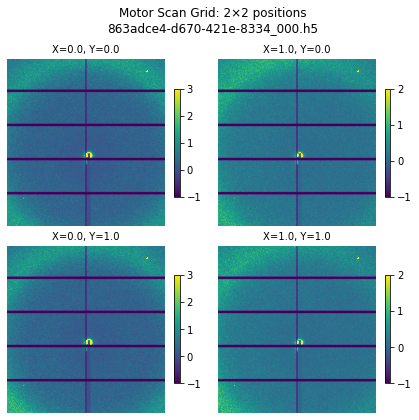

In [38]:
# Get unique motor positions
x_positions = [point['x_pos'] for point in last_scan_data]
y_positions = [point['y_pos'] for point in last_scan_data]

unique_x = sorted(list(set(x_positions)))
unique_y = sorted(list(set(y_positions)))

num_x = len(unique_x)
num_y = len(unique_y)

# Create subplot grid
fig, axes = plt.subplots(num_y, num_x, figsize=(3*num_x, 3*num_y))

# Handle single row/column cases
if num_x == 1 and num_y == 1:
    axes = [[axes]]
elif num_x == 1:
    axes = [[ax] for ax in axes]
elif num_y == 1:
    axes = [axes]

# Plot each image in correct grid position
for i, point in enumerate(last_scan_data):
    x_idx = unique_x.index(point['x_pos'])
    y_idx = unique_y.index(point['y_pos'])
    
    frame = images[i]
    
    im = axes[y_idx][x_idx].imshow(frame, cmap='viridis',
                                   vmin=np.percentile(frame, 2),
                                   vmax=np.percentile(frame, 98))
    
    axes[y_idx][x_idx].set_title(f'X={point["x_pos"]:.1f}, Y={point["y_pos"]:.1f}', fontsize=10)
    axes[y_idx][x_idx].axis('off')
    
    plt.colorbar(im, ax=axes[y_idx][x_idx], shrink=0.6)

# Add main title
plt.suptitle(f'Motor Scan Grid: {num_x}×{num_y} positions\n{last_scan_file.split("/")[-1]}', 
             fontsize=12, y=0.98)

plt.tight_layout()
plt.show()

In [39]:
RE(grid_scan([det], sample_x_mm, 0, 4, 5, sample_y_mm, 0, 1, 2, snake_axes = True), detector_table)


🔬 SCAN STARTED at 18:03:51
Point  X_mm     Y_mm     Time      
----------------------------------------
1      0.000    0.000    18:03:53  
2      0.000    1.000    18:03:56  
3      1.000    1.000    18:03:58  
4      1.000    0.000    18:04:00  
5      2.000    0.000    18:04:03  
6      2.000    1.000    18:04:05  
7      3.000    1.000    18:04:07  
8      3.000    0.000    18:04:10  
9      4.000    0.000    18:04:12  
10     4.000    1.000    18:04:15  
----------------------------------------
✅ SCAN COMPLETED in 23.8s
   Total points: 10

📁 HDF5 File: /mnt/data531/test/pilatus/2025/06/26/cc9f3d92-4a56-4eb2-83be_000.h5
   Size: 5.7 MB

💾 Variables saved for analysis:
   📁 last_scan_file → cc9f3d92-4a56-4eb2-83be_000.h5
   📊 last_scan_data → 10 scan points


('d62c929b-9aca-495b-94bd-b0475ab682dd',)

In [40]:
# Load the HDF5 data
with h5py.File(last_scan_file, 'r') as f:
    # Load all the image data
    images = f['entry/data/data'][:]
    
print(f"📊 Loaded data from: {last_scan_file}")
print(f"   Shape: {images.shape}")

📊 Loaded data from: /mnt/data531/test/pilatus/2025/06/26/cc9f3d92-4a56-4eb2-83be_000.h5
   Shape: (10, 1043, 981)


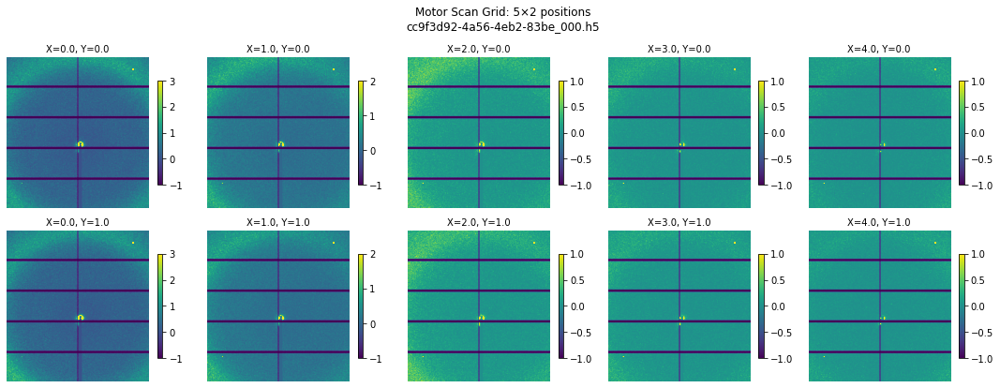

In [41]:
# Get unique motor positions
x_positions = [point['x_pos'] for point in last_scan_data]
y_positions = [point['y_pos'] for point in last_scan_data]

unique_x = sorted(list(set(x_positions)))
unique_y = sorted(list(set(y_positions)))

num_x = len(unique_x)
num_y = len(unique_y)

# Create subplot grid
fig, axes = plt.subplots(num_y, num_x, figsize=(3*num_x, 3*num_y))

# Handle single row/column cases
if num_x == 1 and num_y == 1:
    axes = [[axes]]
elif num_x == 1:
    axes = [[ax] for ax in axes]
elif num_y == 1:
    axes = [axes]

# Plot each image in correct grid position
for i, point in enumerate(last_scan_data):
    x_idx = unique_x.index(point['x_pos'])
    y_idx = unique_y.index(point['y_pos'])
    
    frame = images[i]
    
    im = axes[y_idx][x_idx].imshow(frame, cmap='viridis',
                                   vmin=np.percentile(frame, 2),
                                   vmax=np.percentile(frame, 98))
    
    axes[y_idx][x_idx].set_title(f'X={point["x_pos"]:.1f}, Y={point["y_pos"]:.1f}', fontsize=10)
    axes[y_idx][x_idx].axis('off')
    
    plt.colorbar(im, ax=axes[y_idx][x_idx], shrink=0.6)

# Add main title
plt.suptitle(f'Motor Scan Grid: {num_x}×{num_y} positions\n{last_scan_file.split("/")[-1]}', 
             fontsize=12, y=0.98)

plt.tight_layout()
plt.show()

In [42]:
RE(grid_scan([det], sample_x_mm, 0, 20, 6, sample_y_mm, 0, 20, 6, snake_axes = True), detector_table)


🔬 SCAN STARTED at 18:04:59
Point  X_mm     Y_mm     Time      
----------------------------------------
1      0.000    0.000    18:05:05  
2      0.000    4.000    18:05:10  
3      0.000    8.000    18:05:16  
4      0.000    12.000   18:05:21  
5      0.000    16.000   18:05:26  
6      0.000    20.000   18:05:32  
7      4.000    20.000   18:05:37  
8      4.000    16.000   18:05:42  
9      4.000    12.000   18:05:48  
10     4.000    8.000    18:05:53  
11     4.000    4.000    18:05:59  
12     4.000    0.000    18:06:04  
13     8.000    0.000    18:06:09  
14     8.000    4.000    18:06:15  
15     8.000    8.000    18:06:20  
16     8.000    12.000   18:06:25  
17     8.000    16.000   18:06:31  
18     8.000    20.000   18:06:36  
19     12.000   20.000   18:06:42  
20     12.000   16.000   18:06:47  
21     12.000   12.000   18:06:52  
22     12.000   8.000    18:06:58  
23     12.000   4.000    18:07:03  
24     12.000   0.000    18:07:08  
25     16.000   0.000    18:07:

('5d2c159f-bfc8-47ec-8d7b-4d44312d1dbe',)

📊 Loaded data from: /mnt/data531/test/pilatus/2025/06/26/62193699-3406-46b9-bb35_000.h5
   Shape: (36, 1043, 981)


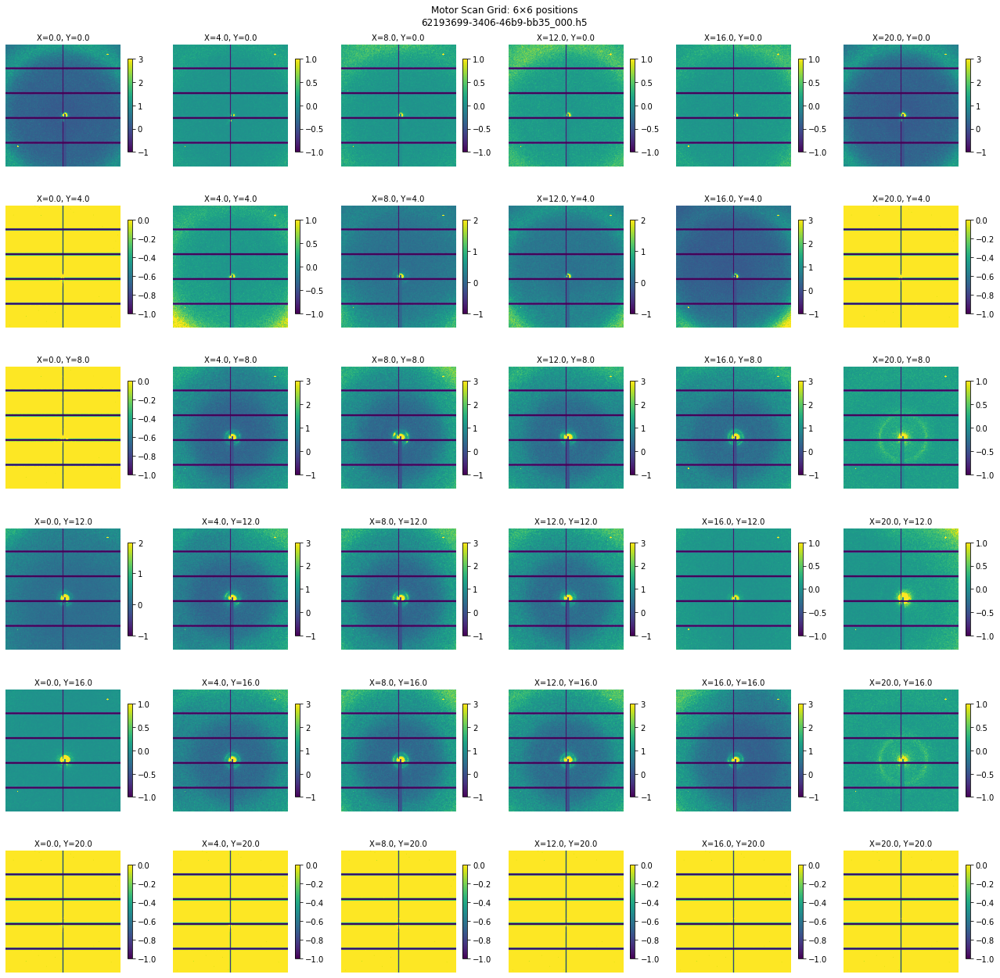

In [43]:
# Load the HDF5 data
with h5py.File(last_scan_file, 'r') as f:
    # Load all the image data
    images = f['entry/data/data'][:]
    
print(f"📊 Loaded data from: {last_scan_file}")
print(f"   Shape: {images.shape}")

# Plot data
%matplotlib inline

# Get unique motor positions
x_positions = [point['x_pos'] for point in last_scan_data]
y_positions = [point['y_pos'] for point in last_scan_data]

unique_x = sorted(list(set(x_positions)))
unique_y = sorted(list(set(y_positions)))

num_x = len(unique_x)
num_y = len(unique_y)

# Create subplot grid
fig, axes = plt.subplots(num_y, num_x, figsize=(3*num_x, 3*num_y))

# Handle single row/column cases
if num_x == 1 and num_y == 1:
    axes = [[axes]]
elif num_x == 1:
    axes = [[ax] for ax in axes]
elif num_y == 1:
    axes = [axes]

# Plot each image in correct grid position
for i, point in enumerate(last_scan_data):
    x_idx = unique_x.index(point['x_pos'])
    y_idx = unique_y.index(point['y_pos'])
    
    frame = images[i]
    
    im = axes[y_idx][x_idx].imshow(frame, cmap='viridis',
                                   vmin=np.percentile(frame, 2),
                                   vmax=np.percentile(frame, 98))
    
    axes[y_idx][x_idx].set_title(f'X={point["x_pos"]:.1f}, Y={point["y_pos"]:.1f}', fontsize=10)
    axes[y_idx][x_idx].axis('off')
    
    plt.colorbar(im, ax=axes[y_idx][x_idx], shrink=0.6)

# Add main title
plt.suptitle(f'Motor Scan Grid: {num_x}×{num_y} positions\n{last_scan_file.split("/")[-1]}', 
             fontsize=12, y=0.98)

plt.tight_layout()
plt.show()

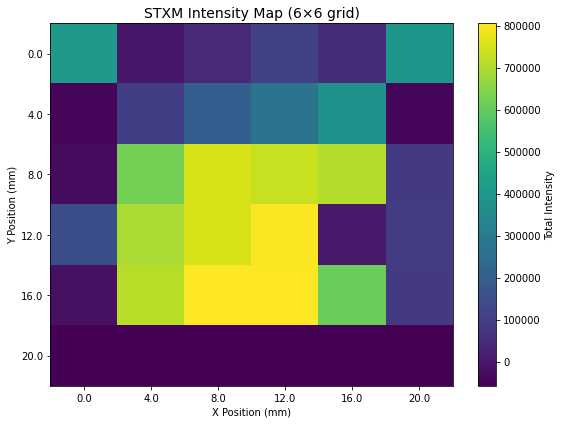

In [47]:
# Calculate sum intensity for each frame
intensities = [np.sum(frame) for frame in images]

# Create intensity grid
x_positions = [point['x_pos'] for point in last_scan_data]
y_positions = [point['y_pos'] for point in last_scan_data]

unique_x = sorted(list(set(x_positions)))
unique_y = sorted(list(set(y_positions)))

intensity_grid = np.zeros((len(unique_y), len(unique_x)))

for i, point in enumerate(last_scan_data):
    x_idx = unique_x.index(point['x_pos'])
    y_idx = unique_y.index(point['y_pos'])
    intensity_grid[y_idx, x_idx] = intensities[i]

# Plot STXM map
plt.figure(figsize=(8, 6))
im = plt.imshow(intensity_grid, cmap='viridis', aspect='auto')
plt.title(f'STXM Intensity Map ({len(unique_x)}×{len(unique_y)} grid)', fontsize=14)
plt.xlabel('X Position (mm)')
plt.ylabel('Y Position (mm)')

# Add position labels
plt.xticks(range(len(unique_x)), [f'{x:.1f}' for x in unique_x])
plt.yticks(range(len(unique_y)), [f'{y:.1f}' for y in unique_y])

plt.colorbar(im, label='Total Intensity')
plt.tight_layout()
plt.show()

### Result

In [48]:
RE(grid_scan([det], sample_x_mm, 0, 20, 21, sample_y_mm, 0, 20, 21, snake_axes = True), detector_table)
# To save time I am doing snake scan


🔬 SCAN STARTED at 18:13:10
Point  X_mm     Y_mm     Time      
----------------------------------------
1      0.000    0.000    18:13:32  
2      0.000    1.000    18:13:34  
3      0.000    2.000    18:13:36  
4      0.000    3.000    18:13:39  
5      0.000    4.000    18:13:41  
6      0.000    5.000    18:13:43  
7      0.000    6.000    18:13:46  
8      0.000    7.000    18:13:48  
9      0.000    8.000    18:13:51  
10     0.000    9.000    18:13:53  
11     0.000    10.000   18:13:55  
12     0.000    11.000   18:13:58  
13     0.000    12.000   18:14:00  
14     0.000    13.000   18:14:03  
15     0.000    14.000   18:14:05  
16     0.000    15.000   18:14:07  
17     0.000    16.000   18:14:10  
18     0.000    17.000   18:14:12  
19     0.000    18.000   18:14:14  
20     0.000    19.000   18:14:17  
21     0.000    20.000   18:14:19  
22     1.000    20.000   18:14:22  
23     1.000    19.000   18:14:24  
24     1.000    18.000   18:14:26  
25     1.000    17.000   18:14:

('497694d9-6a59-4d09-a938-41b9c6300e92',)

In [49]:
# Load the HDF5 data
with h5py.File(last_scan_file, 'r') as f:
    # Load all the image data
    images = f['entry/data/data'][:]
    
print(f"📊 Loaded data from: {last_scan_file}")
print(f"   Shape: {images.shape}")

📊 Loaded data from: /mnt/data531/test/pilatus/2025/06/26/9adbf9cb-b68b-49e4-a45e_000.h5
   Shape: (441, 1043, 981)


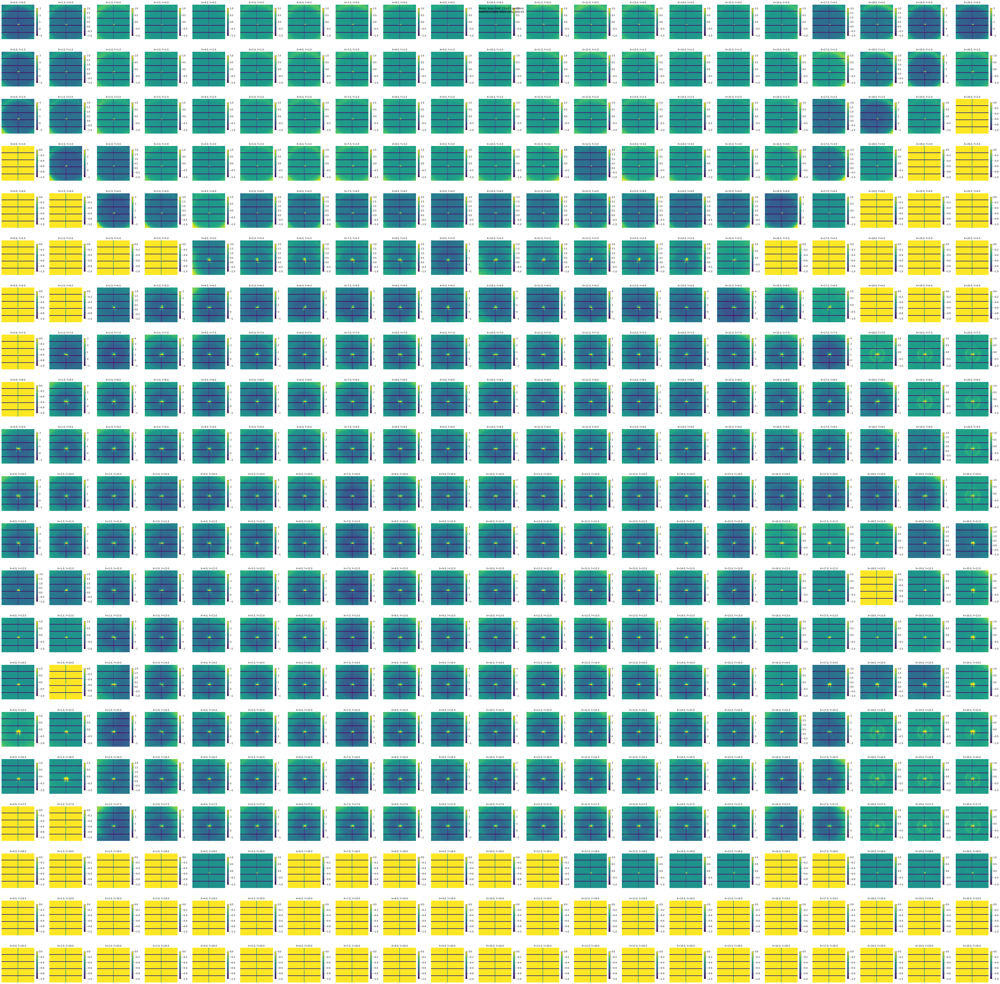

In [50]:
# Plot data
%matplotlib inline

# Get unique motor positions
x_positions = [point['x_pos'] for point in last_scan_data]
y_positions = [point['y_pos'] for point in last_scan_data]

unique_x = sorted(list(set(x_positions)))
unique_y = sorted(list(set(y_positions)))

num_x = len(unique_x)
num_y = len(unique_y)

# Create subplot grid
fig, axes = plt.subplots(num_y, num_x, figsize=(3*num_x, 3*num_y))

# Handle single row/column cases
if num_x == 1 and num_y == 1:
    axes = [[axes]]
elif num_x == 1:
    axes = [[ax] for ax in axes]
elif num_y == 1:
    axes = [axes]

# Plot each image in correct grid position
for i, point in enumerate(last_scan_data):
    x_idx = unique_x.index(point['x_pos'])
    y_idx = unique_y.index(point['y_pos'])
    
    frame = images[i]
    
    im = axes[y_idx][x_idx].imshow(frame, cmap='viridis',
                                   vmin=np.percentile(frame, 2),
                                   vmax=np.percentile(frame, 98))
    
    axes[y_idx][x_idx].set_title(f'X={point["x_pos"]:.1f}, Y={point["y_pos"]:.1f}', fontsize=10)
    axes[y_idx][x_idx].axis('off')
    
    plt.colorbar(im, ax=axes[y_idx][x_idx], shrink=0.6)

# Add main title
plt.suptitle(f'Motor Scan Grid: {num_x}×{num_y} positions\n{last_scan_file.split("/")[-1]}', 
             fontsize=12, y=0.98)

plt.tight_layout()
plt.show()

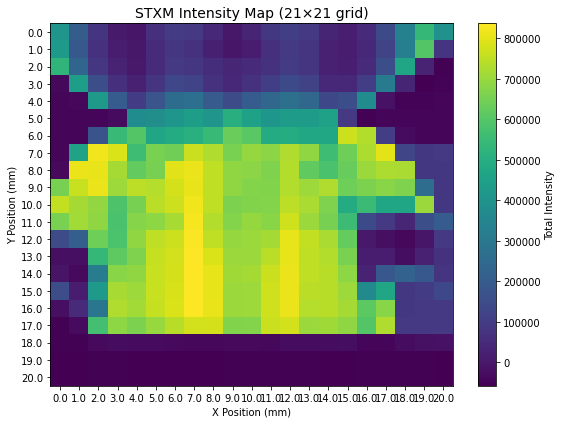

In [51]:
%matplotlib inline

# Calculate sum intensity for each frame
intensities = [np.sum(frame) for frame in images]

intensity_grid = np.zeros((len(unique_y), len(unique_x)))

for i, point in enumerate(last_scan_data):
    x_idx = unique_x.index(point['x_pos'])
    y_idx = unique_y.index(point['y_pos'])
    intensity_grid[y_idx, x_idx] = intensities[i]

# Plot STXM map
plt.figure(figsize=(8, 6))
im = plt.imshow(intensity_grid, cmap='viridis', aspect='auto')
plt.title(f'STXM Intensity Map ({len(unique_x)}×{len(unique_y)} grid)', fontsize=14)
plt.xlabel('X Position (mm)')
plt.ylabel('Y Position (mm)')

# Add position labels
plt.xticks(range(len(unique_x)), [f'{x:.1f}' for x in unique_x])
plt.yticks(range(len(unique_y)), [f'{y:.1f}' for y in unique_y])

plt.colorbar(im, label='Total Intensity')
plt.tight_layout()
plt.show()

In [ ]:
a